Question to be answered:  
Where are the violations in Boston? Distribution of % of violations across Boston.

In [ ]:
!pip install folium

In [6]:
import folium
import pandas as pd
from folium.plugins import HeatMap
import numpy as np

In [7]:
df = pd.read_csv("./RentSmart.csv")

In [ ]:
df['neighborhood'].value_counts()

Dorchester       74177
Boston           60543
Roxbury          31889
South Boston     21021
Brighton         19768
East Boston      17465
Allston          16048
Mattapan         14625
Mission Hill     11925
Jamaica Plain    11597
Hyde Park         9850
Roslindale        8682
Charlestown       7196
West Roxbury      4542
Chestnut Hill       87
Name: neighborhood, dtype: int64

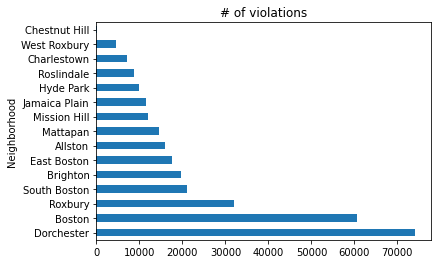

In [ ]:
df.neighborhood.value_counts().plot(kind='barh', ylabel='Neighborhood', title='# of violations')


In [ ]:
pip install geopy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
# Import the required library
from geopy.geocoders import Nominatim

# Initialize Nominatim API
geolocator = Nominatim(user_agent="MyApp")
latitudes = []
longitudes = []

for place in df.neighborhood.value_counts().keys():
  location = geolocator.geocode(place)
  latitudes.append(location.latitude)
  longitudes.append(location.longitude)

print("The latitude of the location is: ", location.latitude)
print("The longitude of the location is: ", location.longitude)

The latitude of the location is:  42.3306529
The longitude of the location is:  -71.1661647


In [ ]:
longitudes

[-2.4371229,
 -71.060511,
 -73.3088922,
 -71.0494949,
 -0.12693054250074665,
 -71.0392173,
 -71.1327494,
 -71.0869953,
 -71.1020285,
 -71.1143838,
 -0.16223668308067218,
 -71.1244966,
 -72.424622,
 -71.1494972,
 -71.1661647]

In [7]:
value_counts = df['neighborhood'].value_counts()

# solution here
df_val_counts = pd.DataFrame(value_counts)
df_value_counts_reset = df_val_counts.reset_index()
df_value_counts_reset.columns = ['neighborhood', 'counts']
df_value_counts_reset['latitude'] = latitudes
df_value_counts_reset['longitude'] = longitudes

heatmap_df = df_value_counts_reset[['latitude','longitude','counts']]
heatmap_df['counts'] = (((100 * heatmap_df['counts'] / heatmap_df['counts'].sum()).round(0))).astype(int)
#heatmap_df.drop(columns=['counts'])

<ipython-input-7-9a8d3e81d455>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  heatmap_df['counts'] = (((100 * heatmap_df['counts'] / heatmap_df['counts'].sum()).round(0))).astype(int)


In [ ]:
map_obj = folium.Map(location=[42.3601, -71.0589], zoom_start=11)
hm = HeatMap(heatmap_df, blur=20)
hm.add_to(map_obj)
map_obj

In [ ]:
heatmap_df = df[['latitude', 'longitude']]
map_obj = folium.Map(location=[42.3601, -71.0589], zoom_start=11)
hm = HeatMap(heatmap_df, blur=50)
hm.add_to(map_obj)
map_obj

In [8]:
neighborhoods = list(df['neighborhood'].value_counts().keys())

In [ ]:
population_df = pd.read_csv('./boston-neighborhood-data.csv')
population_df.head()

,nbhd,P0020001,P0020005,P0020006,P0020002,P002aapi,P002others,P0040001,P0040005,P0040006,...,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,H0010001,H0010002,H0010003,hhsize
0,field concept,Total:,White alone,Black or African American alone,Hispanic or Latino,"Asian, Native Hawaiian and Pacific Islander al...","Other Races or Multiple Races, all ages",Total:,White alone,Black or African American alone,...,Nursing facilities/Skilled-nursing facilities,Other institutional facilities,Noninstitutionalized population:,College/University student housing,Military quarters,Other noninstitutional facilities,Total:,Occupied,Vacant,household size
1,Allston,28621,14634,1451,3657,7173,1706,26668,14022,1294,...,26,0,3364,3214,0,150,12527,11740,787,2.149148211
2,Back Bay,19588,14056,718,1326,2604,884,18374,13296,669,...,269,0,1701,1578,0,123,12373,10788,1585,1.633110864
3,Beacon Hill,9336,7521,252,537,630,396,8603,6980,231,...,0,0,33,0,0,33,6037,5485,552,1.696080219
4,Brighton,48330,30596,2289,4978,7801,2666,44129,28706,1966,...,240,56,3713,3493,0,220,21874,20822,1052,2.1279416


In [ ]:
population_df.columns

Index(['nbhd', 'P0020001', 'P0020005', 'P0020006', 'P0020002', 'P002aapi',
       'P002others', 'P0040001', 'P0040005', 'P0040006', 'P0040002',
       'P004aapi', 'P004others', 'P00x0001', 'P00x0005', 'P00x0006',
       'P00x0002', 'P00xaapi', 'P00xothers', 'hhpop', 'P0050001', 'P0050002',
       'P0050003', 'P0050004', 'P0050005', 'P0050006', 'P0050007', 'P0050008',
       'P0050009', 'P0050010', 'H0010001', 'H0010002', 'H0010003', 'hhsize'],
      dtype='object')

In [ ]:
population_df.loc[0]

nbhd                                              field concept
P0020001                                                 Total:
P0020005                                            White alone
P0020006                        Black or African American alone
P0020002                                     Hispanic or Latino
P002aapi      Asian, Native Hawaiian and Pacific Islander al...
P002others             Other Races or Multiple Races,  all ages
P0040001                                                 Total:
P0040005                                            White alone
P0040006                        Black or African American alone
P0040002                                     Hispanic or Latino
P004aapi      Asian, Native Hawaiian and Pacific Islander al...
P004others              Other Races or Multiple Races, aged 18+
P00x0001                                      Total:, aged 0-17
P00x0005                                 White alone, aged 0-17
P00x0006             Black or African Am

In [ ]:
pop_df = population_df.iloc[1:, :]
#pop_df.
for idx, row in pop_df.iterrows():
    if row['nbhd'] not in neighborhoods:
        print(idx)
        pop_df = pop_df.drop([idx])
pop_df = pop_df.reset_index(drop=True)
pop_df.head(23)

#pop_df = population_df.loc[(population_df['nbhd'] is in neighborhoods)]

2
3
6
8
10
13
16
20
21
22


,nbhd,P0020001,P0020005,P0020006,P0020002,P002aapi,P002others,P0040001,P0040005,P0040006,...,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,H0010001,H0010002,H0010003,hhsize
0,Allston,28621,14634,1451,3657,7173,1706,26668,14022,1294,...,26,0,3364,3214,0,150,12527,11740,787,2.149148211
1,Brighton,48330,30596,2289,4978,7801,2666,44129,28706,1966,...,240,56,3713,3493,0,220,21874,20822,1052,2.1279416
2,Charlestown,19120,13626,990,2075,1650,779,15661,11689,662,...,55,0,55,0,30,25,9525,8932,593,2.128302732
3,Dorchester,122191,27411,42714,25285,13360,13421,95365,24327,32678,...,291,0,936,0,0,936,47965,44823,3142,2.692323138
4,East Boston,43066,15760,1403,21700,1932,2271,34826,14039,1136,...,132,0,109,0,0,109,18016,16695,1321,2.564420485
5,Hyde Park,33009,7449,15171,7901,677,1811,26470,6494,12229,...,67,0,134,64,0,70,12613,12066,547,2.719045251
6,Jamaica Plain,41012,22032,4686,8921,2985,2388,34817,19642,3848,...,319,120,529,160,0,369,18891,17724,1167,2.25423155
7,Mattapan,23834,1489,16277,4079,490,1499,18511,1332,12951,...,85,0,102,0,0,102,9346,8821,525,2.66250992
8,Mission Hill,17886,6950,2469,3397,4228,842,15983,6661,1984,...,112,0,1667,1502,0,165,7139,6820,319,2.361143695
9,Roslindale,29386,13428,6045,7373,1018,1522,23604,11486,4740,...,438,0,57,0,0,57,12114,11534,580,2.504074909


In [ ]:
#Normalizing number of violations using population per neighborhood
neighborhoods_to_violations_dict = dict(df.neighborhood.value_counts())
neighborhood_to_normalized_violations_map = {}
for idx, row in pop_df.iterrows():
    n = row['nbhd']
    total_pop = int(row['P0020001'])
    normalized_violations = neighborhoods_to_violations_dict[n]/total_pop
    neighborhood_to_normalized_violations_map[n] = normalized_violations 


In [ ]:
population_df[['nbhd', 'P0020001']]

,nbhd,P0020001
0,field concept,Total:
1,Allston,28621
2,Back Bay,19588
3,Beacon Hill,9336
4,Brighton,48330
5,Charlestown,19120
6,Chinatown,7143
7,Dorchester,122191
8,Downtown,13451
9,East Boston,43066


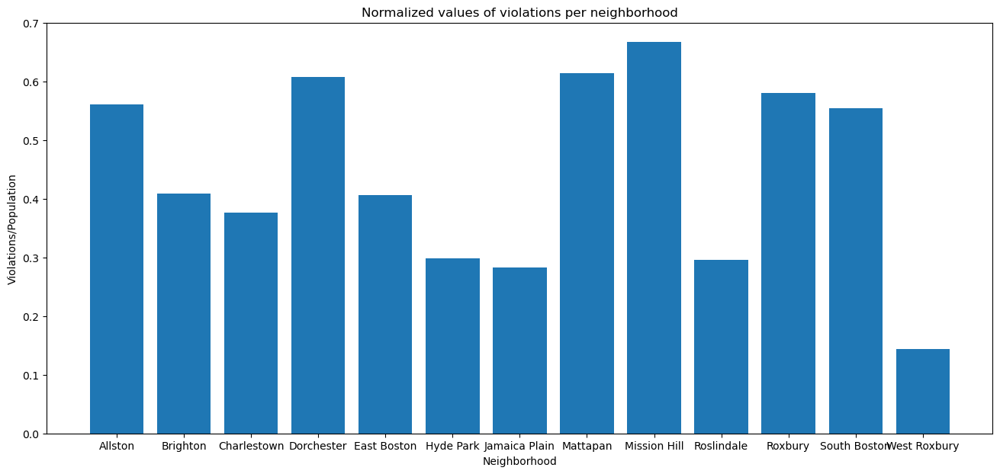

In [ ]:
import matplotlib.pyplot as plt
x = list(neighborhood_to_normalized_violations_map.keys())
y = list(neighborhood_to_normalized_violations_map.values())
fig = plt.figure(figsize = (16, 7))
plt.bar(x, y)
plt.xlabel('Neighborhood')
plt.ylabel('Violations/Population')
plt.title('Normalized values of violations per neighborhood')
plt.show()

In [43]:
del(neighborhoods_to_violations_dict['Boston'])
del(neighborhoods_to_violations_dict['Chestnut Hill'])
#del(neighborhoods_to_violations_dict['Mission Hill'])

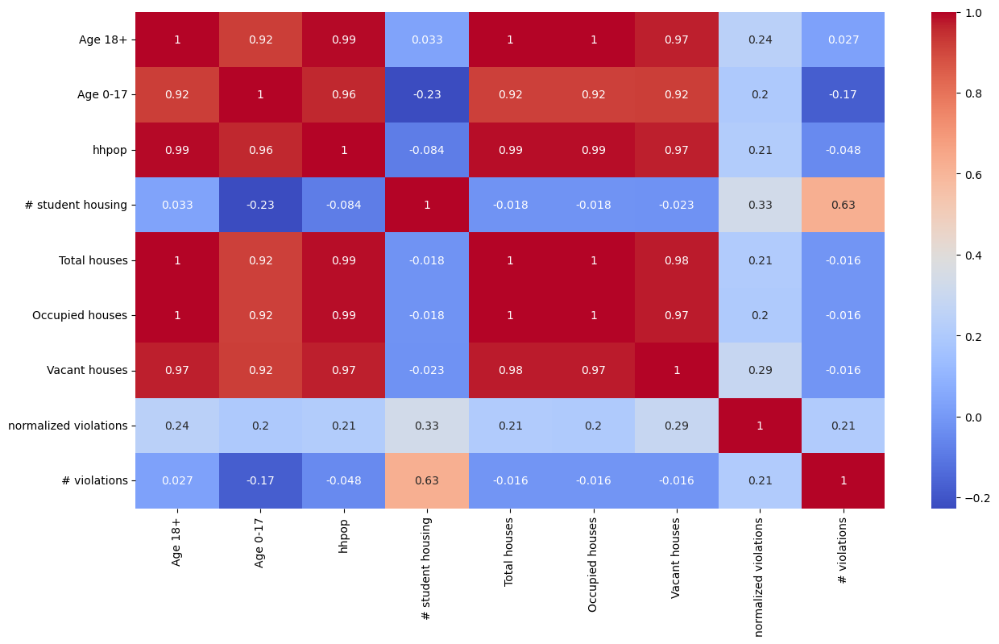

In [ ]:
import seaborn as sns
import statsmodels.api as sm
#P0040001 - total population of 18+
#P00x0001 - total population of 0-17
#hhpop - household population
#P0050008 - college/university houses
#H0010001 - Total houses
#H0010002 - occupied houses
#H0010003 - vacant houses
X = pd.DataFrame(pop_df[['P0040001', 'P00x0001', 'hhpop', 'P0050008', 'H0010001', 'H0010002', 'H0010003']])
X.rename(columns = {'P0040001':'Age 18+', 'P00x0001':'Age 0-17', 'P0050008':'# student housing', 'H0010001': 'Total houses', 'H0010002':'Occupied houses', 'H0010003':'Vacant houses'}, inplace=True)
X = X.astype('int')
X['normalized violations'] = y
X['# violations'] = list(neighborhoods_to_violations_dict.values())

corr = X.corr() 
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot= True, cmap='coolwarm');

In [ ]:
X.head()

,Age 18+,Age 0-17,hhpop,# student housing,Total houses,Occupied houses,Vacant houses,normalized violations
0,26668,1953,25231,3214,12527,11740,787,0
1,44129,4201,44308,3493,21874,20822,1052,0
2,15661,3459,19010,0,9525,8932,593,0
3,95365,26826,120678,0,47965,44823,3142,0
4,34826,8240,42813,0,18016,16695,1321,0


/var/folders/kv/nl6qj61x3cb76zx8sn8pv4p40000gn/T/ipykernel_36774/2662385946.py:5: RuntimeWarning: divide by zero encountered in long_scalars
  normalized_violations = neighborhoods_to_violations_dict[n]/student_housing


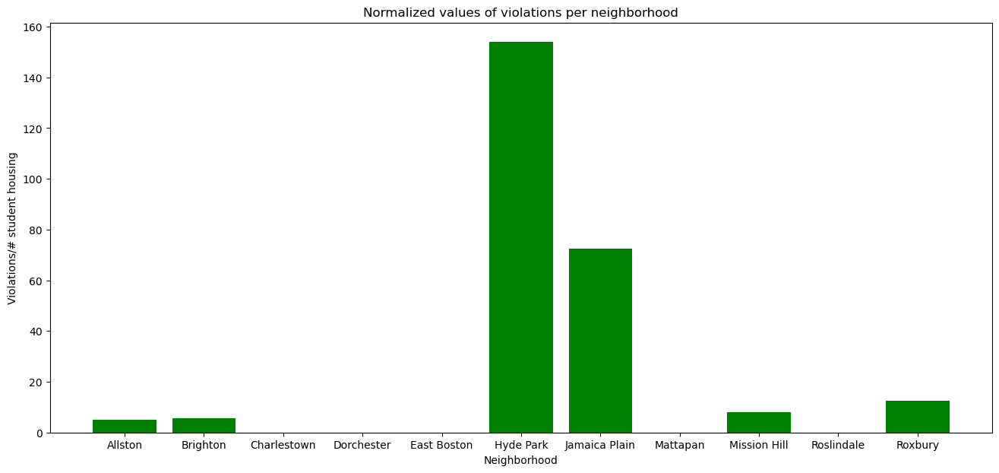

In [ ]:
neighborhood_to_normalized_violations_by_student_map = {}
for idx, row in pop_df.iterrows():
    n = row['nbhd']
    student_housing = int(row['P0050008'])
    normalized_violations = neighborhoods_to_violations_dict[n]/student_housing
    neighborhood_to_normalized_violations_by_student_map[n] = normalized_violations 

x = list(neighborhood_to_normalized_violations_by_student_map.keys())
y = list(neighborhood_to_normalized_violations_by_student_map.values())
fig = plt.figure(figsize = (16, 7))
plt.bar(x, y, color='green')
plt.xlabel('Neighborhood')
plt.ylabel('Violations/# student housing')
plt.title('Normalized values of violations per neighborhood')
plt.show()

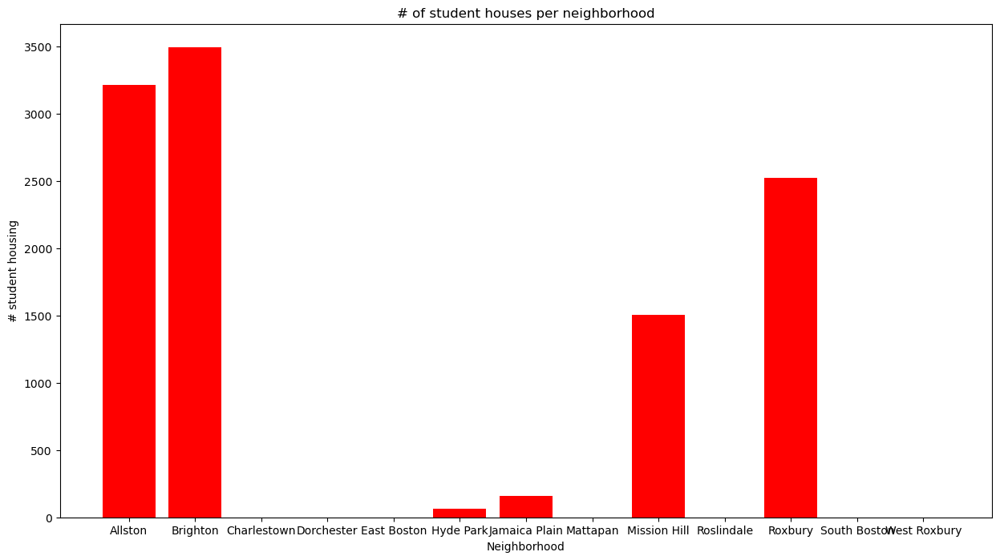

In [ ]:
x = pop_df['nbhd']
y = X['# student housing']
#y = X['# violations']
plt.figure(figsize=(15,8))
plt.bar(x, y, color='red')
plt.ylabel('# student housing')
plt.xlabel('Neighborhood')
plt.title('# of student houses per neighborhood')
plt.show()

In [74]:
#Storing only Housing violations and complaints in dictionary grouped by neighborhood
neighborhoods_to_violations_dict = dict(df['neighborhood'][(df['violation_type'] == 'Housing Complaints') | (df['violation_type'] == 'Housing Violations')].value_counts())

In [ ]:
neighborhoods_to_violations_dict

In [15]:
xls = pd.ExcelFile('Household Stats.xlsx')
df_household_stats = pd.read_excel(xls, 'Vacancy Rates')

In [16]:
df_household_stats.rename(columns={ df_household_stats.columns[0]: "Place" }, inplace = True)

In [17]:
df_household_stats = df_household_stats[:25]

In [43]:
df_household_stats.head()

,Place,Total Housing Units:,Vacant Units,% of Total Housing Units,For rent,% of Vacant,"Rented, not occupied",% of Vacant.1,For sale only,% of Vacant.2,"Sold, not occupied",% of Vacant.3,"For seasonal, recreational, or occasional use",% of Vacant.4,Other vacant,% of Vacant.5
0,United States,137428986.0,16672938.0,0.121320,2793023.0,0.167518,604804.0,0.036275,1257737.0,0.075436,654889.0,0.039279,5440455.0,0.326305,5922030.0,0.355188
1,Massachusetts,2897259.0,279762.0,0.096561,36805.0,0.131558,12327.0,0.044062,16147.0,0.057717,14676.0,0.052459,127398.0,0.455380,72409.0,0.258824
2,Boston,294418.0,24896.0,0.084560,5399.0,0.216862,3474.0,0.139540,1234.0,0.049566,4798.0,0.192722,4626.0,0.185813,5365.0,0.215496
3,Allston,7052.0,526.0,0.074589,225.0,0.427757,178.0,0.338403,0.0,0.000000,20.0,0.038023,40.0,0.076046,63.0,0.119772
4,Back Bay,11971.0,2142.0,0.178932,275.0,0.128385,169.0,0.078898,36.0,0.016807,61.0,0.028478,1244.0,0.580766,357.0,0.166667


In [65]:
neighborhood_to_normalized_violations_by_household = {}
for idx, row in df_household_stats.iterrows():
    n = int(row['Total Housing Units: ']) - int(row['Vacant Units'])
    place = row['Place'].strip()
    if place in neighborhoods_to_violations_dict.keys():
        normalized_violations = neighborhoods_to_violations_dict[place]/n
        neighborhood_to_normalized_violations_by_household[place] = normalized_violations 

neighborhood_to_normalized_violations_by_household

{'Boston': 0.028539414222215627,
 'Allston': 0.2916028194912657,
 'Brighton': 0.12393162393162394,
 'Charlestown': 0.15607945863348613,
 'Dorchester': 0.33024085235096273,
 'East Boston': 0.2570479927558104,
 'Hyde Park': 0.17053320149083442,
 'Jamaica Plain': 0.1706143822687694,
 'Mattapan': 0.3068788836803663,
 'Mission Hill': 0.16120831464034693,
 'Roslindale': 0.16329907681588574,
 'Roxbury': 0.29232624755012815,
 'South Boston': 0.25260011954572625,
 'West Roxbury': 0.09244240292829972}

In [10]:
import matplotlib.pyplot as plt

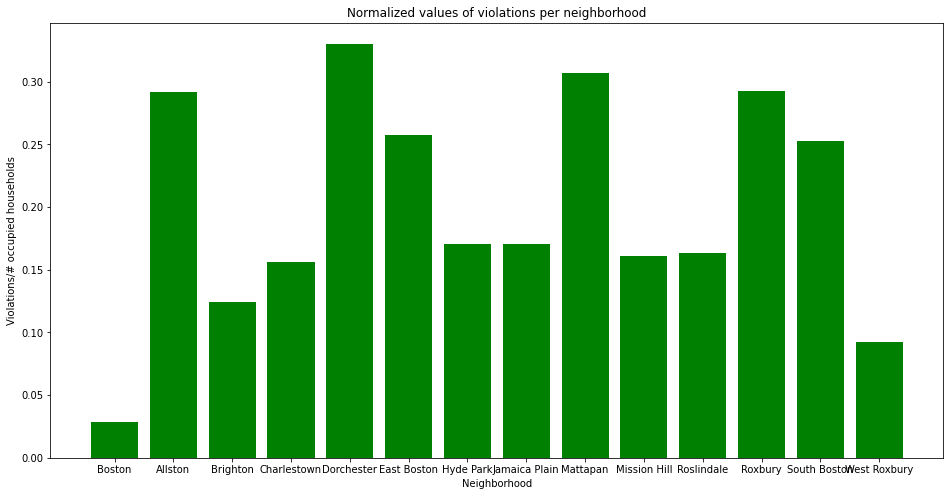

In [66]:
x = list(neighborhood_to_normalized_violations_by_household.keys())
y_household = list(neighborhood_to_normalized_violations_by_household.values())
fig = plt.figure(figsize = (16, 8))
plt.bar(x, y_household, color='green')
plt.xlabel('Neighborhood')
plt.ylabel('Violations/# occupied households')
plt.title('Normalized values of violations per neighborhood')
plt.show()

In [62]:
#normalizing based on recent population
df_pop = pd.read_excel(xls, 'Age')
df_pop.rename(columns={ df_pop.columns[0]: "Place" }, inplace = True)
df_pop = df_pop[:25]
neighborhood_to_normalized_violations_by_population = {}
for idx, row in df_pop.iterrows():
    place = row['Place'].strip()
    total_pop = int(row['Total Population'])
    if place in neighborhoods_to_violations_dict.keys():
      normalized_violations = neighborhoods_to_violations_dict[place]/total_pop
      neighborhood_to_normalized_violations_by_population[place] = normalized_violations 

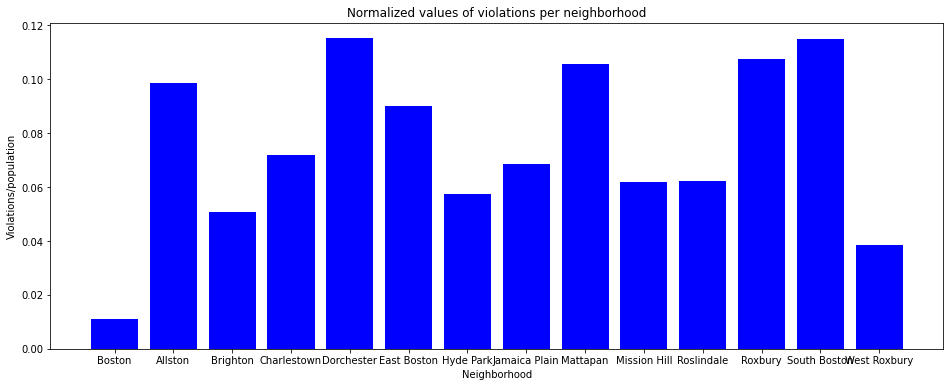

In [141]:
x = list(neighborhood_to_normalized_violations_by_population.keys())
y_pop = list(neighborhood_to_normalized_violations_by_population.values())
fig = plt.figure(figsize = (16, 6))
plt.bar(x, y_pop, color='blue')
plt.xlabel('Neighborhood')
plt.ylabel('Violations/population')
plt.title('Normalized values of violations per neighborhood')
plt.show()

In [106]:
index = []
def getNeighborhoodsInRentsmart(df):
  # for idx, row in df.iterrows():
  #   place = row['Place'].strip()
  #   if place not in list(neighborhoods_to_violations_dict.keys()):
  #     index.append(idx)
  # df.drop(index=index, inplace=True)
  df = df[df['Place'].str.strip().isin(neighborhoods_to_violations_dict.keys())]
  return df

def finalNeighborhoodsForViolations(df, n_dict):
  final_dict = {}
  #df['Place'] = df.apply(lambda x: x.str.strip())
  places = list(df['Place'].str.strip())
  for place in n_dict.keys():
    
    if place in places:
      final_dict[place] = n_dict[place]
  return final_dict


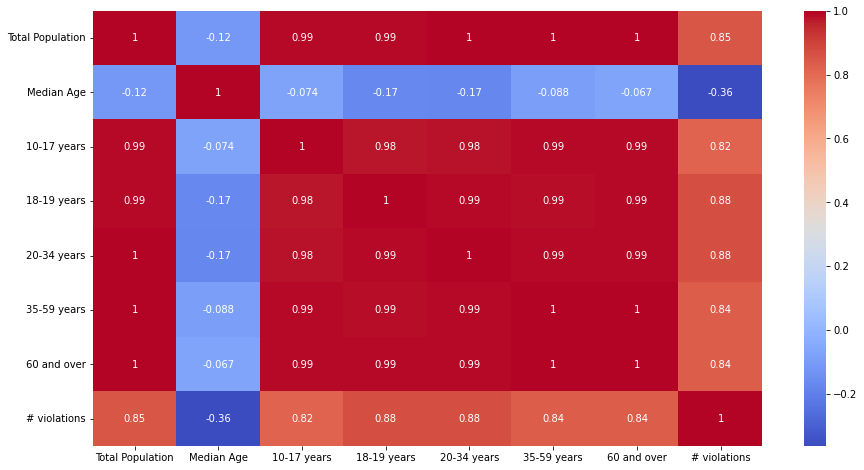

In [107]:
import seaborn as sns
import statsmodels.api as sm

X = pd.DataFrame(df_pop[['Place', 'Total Population', 'Median Age', '10-17 years', '18-19 years', '20-34 years', '35-59 years', '60 and over']])
#X.rename(columns = {'P0040001':'Age 18+', 'P00x0001':'Age 0-17', 'P0050008':'# student housing', 'H0010001': 'Total houses', 'H0010002':'Occupied houses', 'H0010003':'Vacant houses'}, inplace=True)
X = getNeighborhoodsInRentsmart(X)
#X = X[:25]
X['# violations'] = list(finalNeighborhoodsForViolations(X, neighborhoods_to_violations_dict).values())
X = X.drop(columns=['Place'])
X = X.astype('int')

corr = X.corr() 
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot= True, cmap='coolwarm');

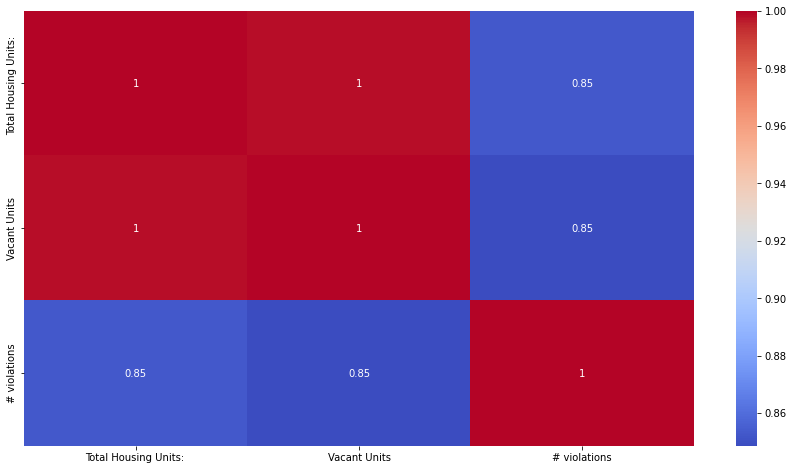

In [109]:
X = pd.DataFrame(df_household_stats[['Place', 'Total Housing Units: ', 'Vacant Units']])
#X.rename(columns = {'P0040001':'Age 18+', 'P00x0001':'Age 0-17', 'P0050008':'# student housing', 'H0010001': 'Total houses', 'H0010002':'Occupied houses', 'H0010003':'Vacant houses'}, inplace=True)
X = getNeighborhoodsInRentsmart(X)
#X = X[:25]
X['# violations'] = list(finalNeighborhoodsForViolations(X, neighborhoods_to_violations_dict).values())
X = X.drop(columns=['Place'])
X = X.astype('int')

corr = X.corr() 
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot= True, cmap='coolwarm');

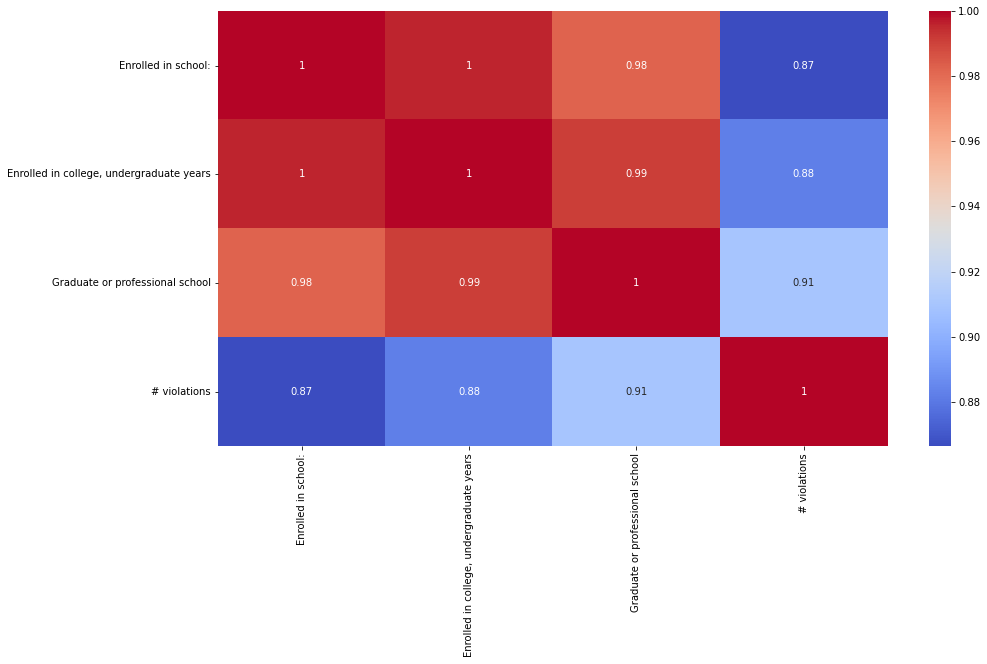

In [118]:
df_school = pd.read_excel(xls, 'School Enrollment')
df_school.rename(columns={ df_school.columns[0]: "Place" }, inplace = True)
X = pd.DataFrame(df_school[['Place', 'Enrolled in school:', 'Enrolled in college, undergraduate years', 'Graduate or professional school']])
#X.rename(columns = {'P0040001':'Age 18+', 'P00x0001':'Age 0-17', 'P0050008':'# student housing', 'H0010001': 'Total houses', 'H0010002':'Occupied houses', 'H0010003':'Vacant houses'}, inplace=True)
X = getNeighborhoodsInRentsmart(X)
#X = X[:25]
X['# violations'] = list(finalNeighborhoodsForViolations(X, neighborhoods_to_violations_dict).values())
X = X.drop(columns=['Place'])
X = X.astype('int')

corr = X.corr() 
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot= True, cmap='coolwarm');

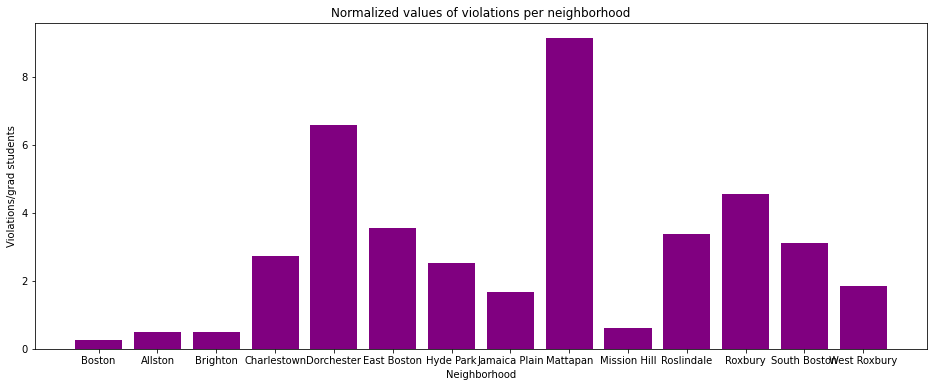

In [138]:
df_school = pd.read_excel(xls, 'School Enrollment')
df_school.rename(columns={ df_school.columns[0]: "Place" }, inplace = True)
df_school = df_school[:25]

neighborhood_to_normalized_violations_by_students = {}
for idx, row in df_school.iterrows():
    place = row['Place'].strip()
    total_pop = int(row['Graduate or professional school'])
    if place in neighborhoods_to_violations_dict.keys():
      normalized_violations = neighborhoods_to_violations_dict[place]/total_pop
      neighborhood_to_normalized_violations_by_students[place] = normalized_violations 

x = list(neighborhood_to_normalized_violations_by_students.keys())
y_pop = list(neighborhood_to_normalized_violations_by_students.values())
fig = plt.figure(figsize = (16, 6))
plt.bar(x, y_pop, color='purple')
plt.xlabel('Neighborhood')
plt.ylabel('Violations/grad students')
plt.title('Normalized values of violations per neighborhood')
plt.show()

In [128]:
type(df_school.Place[0])

str

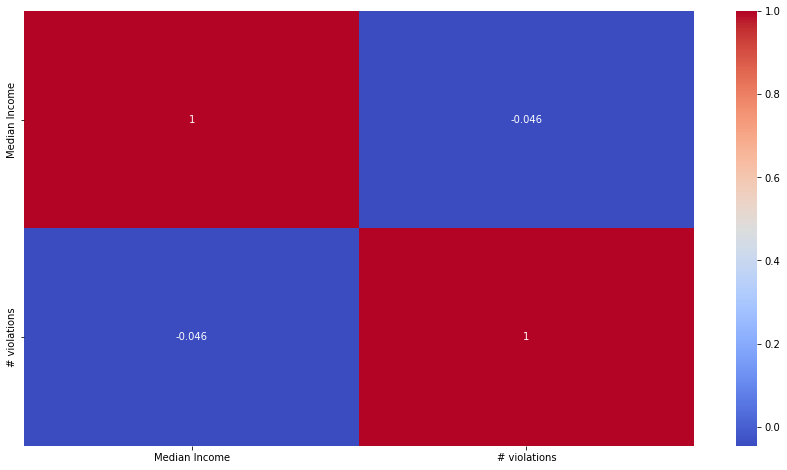

In [112]:
df_income = pd.read_excel(xls, 'Household Income')
df_income.rename(columns={ df_income.columns[0]: "Place" }, inplace = True)
X = pd.DataFrame(df_income[['Place', 'Median Income']])
#X.rename(columns = {'P0040001':'Age 18+', 'P00x0001':'Age 0-17', 'P0050008':'# student housing', 'H0010001': 'Total houses', 'H0010002':'Occupied houses', 'H0010003':'Vacant houses'}, inplace=True)
X = getNeighborhoodsInRentsmart(X)
#X = X[:25]
X['# violations'] = list(finalNeighborhoodsForViolations(X, neighborhoods_to_violations_dict).values())
X = X.drop(columns=['Place'])
X = X.astype('int')

corr = X.corr() 
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot= True, cmap='coolwarm');

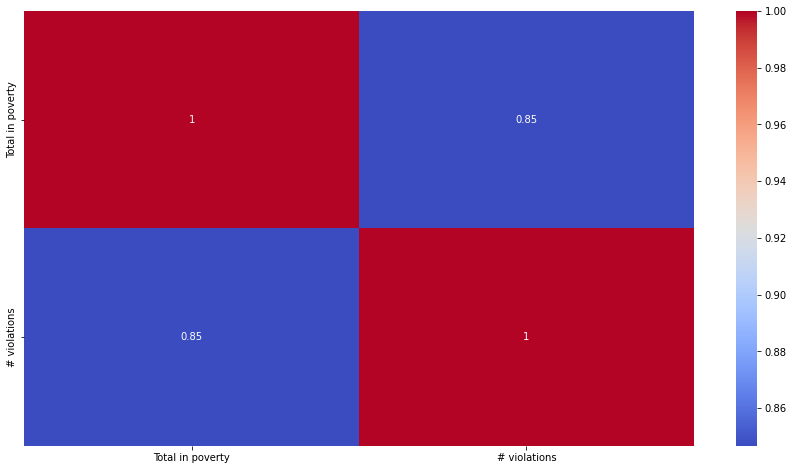

In [116]:
df_poverty = pd.read_excel(xls, 'Poverty Rates')
df_poverty.rename(columns={ df_poverty.columns[0]: "Place" }, inplace = True)
X = pd.DataFrame(df_poverty[['Place', 'Total in poverty']])
#X.rename(columns = {'P0040001':'Age 18+', 'P00x0001':'Age 0-17', 'P0050008':'# student housing', 'H0010001': 'Total houses', 'H0010002':'Occupied houses', 'H0010003':'Vacant houses'}, inplace=True)
X = getNeighborhoodsInRentsmart(X)
#X = X[:25]
X['# violations'] = list(finalNeighborhoodsForViolations(X, neighborhoods_to_violations_dict).values())
X = X.drop(columns=['Place'])
X = X.astype('int')

corr = X.corr() 
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot= True, cmap='coolwarm');

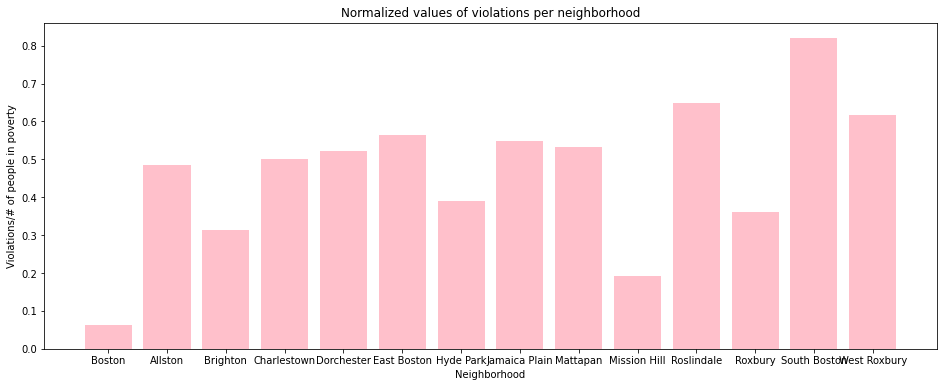

In [142]:
df_poverty = df_poverty[:25]

neighborhood_to_normalized_violations_by_poverty = {}
for idx, row in df_poverty.iterrows():
    place = row['Place'].strip()
    total_pop = int(row['Total in poverty'])
    if place in neighborhoods_to_violations_dict.keys():
      normalized_violations = neighborhoods_to_violations_dict[place]/total_pop
      neighborhood_to_normalized_violations_by_poverty[place] = normalized_violations 

x = list(neighborhood_to_normalized_violations_by_poverty.keys())
y_pop = list(neighborhood_to_normalized_violations_by_poverty.values())
fig = plt.figure(figsize = (16, 6))
plt.bar(x, y_pop, color='pink')
plt.xlabel('Neighborhood')
plt.ylabel('Violations/# of people in poverty')
plt.title('Normalized values of violations per neighborhood')
plt.show()

In [4]:
pip install geopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.8/119.8 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 6.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [19]:
# Importing required module
from geopy.geocoders import Nominatim
 
# Using Nominatim Api
geolocator = Nominatim(user_agent="geoapiExercises")
 
# Zipcode input
zipcode = "02124"
 
# Using geocode()
location = geolocator.geocode(zipcode)
 
# Displaying address details
print("Zipcode:",zipcode)
print("Details of the Zipcode:")
print(location)
print(str(location).split(','))

Zipcode: 02124
Details of the Zipcode:
Dorchester, Boston, Suffolk County, Massachusetts, 02124, United States
['Dorchester', ' Boston', ' Suffolk County', ' Massachusetts', ' 02124', ' United States']


In [8]:
df = pd.read_csv("./RentSmart.csv")
neighborhoods_to_violations_dict = dict(df['neighborhood'][(df['violation_type'] == 'Housing Complaints') | (df['violation_type'] == 'Housing Violations')].value_counts())

In [9]:
off_campus_students_per_neighborhood = {}

In [10]:
def getLocationFromZipcode(zipcode):
    # Using geocode()
    if isinstance(zipcode, float):
        zipcode = str(int(zipcode))
    else:
        zipcode = str(zipcode)
    if(zipcode[0] != '0'):
        zipcode = '0' + zipcode
    location = geolocator.geocode(zipcode)
    place = str(location).split(',')[0]
    if '/' in place:
        place = str(location).split(',')[1].strip()
    places = list(off_campus_students_per_neighborhood.keys())

    valid_places = list(neighborhoods_to_violations_dict.keys())
    if place in valid_places:
        
        if place not in places:
            off_campus_students_per_neighborhood[place] = 1
        else:
            off_campus_students_per_neighborhood[place] = off_campus_students_per_neighborhood[place] + 1
    #return off_campus_students_per_neighborhood

In [13]:
import os

def getOffCampusStudentsPerNeighborhood(directory):
    for filename in sorted(os.listdir(directory)):
        #f = './Zipcodes.xlsx'
        f = os.path.join(directory, filename)
        # checking if it is a file
        if os.path.isfile(f):
            df = pd.read_excel(f, 'Student Addresses')
            #df = pd.read_excel(f)
            #try:
            #off_campus_students_per_neighborhood = df['6e. \nZip'].apply(getLocationFromZipcode)
            try:
                df['6e. \nZip'].apply(getLocationFromZipcode)
            except Exception as e:
                print(e)
                print(f)
                continue
            print(f)
            print(off_campus_students_per_neighborhood)
            #off_campus_students_per_neighborhood = df.apply(lambda x: getLocationFromZipcode(x['6e. \nZip'], off_campus_students_per_neighborhood))
    #return off_campus_students_per_neighborhood

In [17]:
#off_campus_students_per_neighborhood = getOffCampusStudentsPerNeighborhood('./2021-2022 College Reports')
getOffCampusStudentsPerNeighborhood('./2021-2022 College Reports')

./2021-2022 College Reports/AY21-22 Bay State College.xlsx
{'Dorchester': 3, 'Mattapan': 1, 'East Boston': 1, 'Mission Hill': 1, 'Brighton': 1}
./2021-2022 College Reports/AY21-22 Berklee College of Music-Boston Conservatory.xlsx
{'Dorchester': 13, 'Mattapan': 3, 'East Boston': 21, 'Mission Hill': 48, 'Brighton': 163, 'Allston': 320, 'South Boston': 10, 'Boston': 2449, 'Roslindale': 9, 'Roxbury': 39, 'Charlestown': 2, 'Hyde Park': 5}
./2021-2022 College Reports/AY21-22 Boston Architectural College.xlsx
{'Dorchester': 20, 'Mattapan': 5, 'East Boston': 25, 'Mission Hill': 49, 'Brighton': 177, 'Allston': 336, 'South Boston': 14, 'Boston': 2466, 'Roslindale': 11, 'Roxbury': 40, 'Charlestown': 3, 'Hyde Park': 5}
'6e. \nZip'
./2021-2022 College Reports/AY21-22 Boston Baptist College.xlsx
./2021-2022 College Reports/AY21-22 Boston College WCAS.xlsx
{'Dorchester': 22, 'Mattapan': 5, 'East Boston': 25, 'Mission Hill': 49, 'Brighton': 184, 'Allston': 338, 'South Boston': 14, 'Boston': 2467, 'Ros

/Users/janki/opt/anaconda3/lib/python3.9/site-packages/openpyxl/worksheet/_read_only.py:79: UserWarning: Unknown extension is not supported and will be removed
  for idx, row in parser.parse():


./2021-2022 College Reports/AY21-22 Massachusetts College of Art and Design.xlsx
{'Dorchester': 123, 'Mattapan': 26, 'East Boston': 180, 'Mission Hill': 738, 'Brighton': 3136, 'Allston': 4191, 'South Boston': 171, 'Boston': 5662, 'Roslindale': 57, 'Roxbury': 266, 'Charlestown': 35, 'Hyde Park': 38}
./2021-2022 College Reports/AY21-22 Massachusetts Institute of Technology.xlsx
{'Dorchester': 128, 'Mattapan': 27, 'East Boston': 185, 'Mission Hill': 748, 'Brighton': 3162, 'Allston': 4246, 'South Boston': 189, 'Boston': 5837, 'Roslindale': 58, 'Roxbury': 270, 'Charlestown': 41, 'Hyde Park': 41}
./2021-2022 College Reports/AY21-22 New England College of Optometry.xlsx
{'Dorchester': 128, 'Mattapan': 27, 'East Boston': 187, 'Mission Hill': 751, 'Brighton': 3188, 'Allston': 4326, 'South Boston': 189, 'Boston': 6056, 'Roslindale': 58, 'Roxbury': 270, 'Charlestown': 41, 'Hyde Park': 41}
./2021-2022 College Reports/AY21-22 New England Conservatory University.xlsx
{'Dorchester': 130, 'Mattapan': 

In [20]:
#Boston Baptist College
#DON'T RUN AGAIN
off_campus_students_per_neighborhood['Dorchester'] = off_campus_students_per_neighborhood['Dorchester'] + 1

In [50]:
def getOffCampusStudentsPerNeighborhoodForCollege(filepath):
    # checking if it is a file
    if os.path.isfile(filepath):
        df = pd.read_excel(filepath)
        try:
            df['Zipcode'].apply(getLocationFromZipcode)
        except Exception as e:
            print(e)
            print(filepath)
        print(filepath)
        print(off_campus_students_per_neighborhood)

In [51]:
#Zipcodes contains data from Emmanuel, Boston College, NEU
getOffCampusStudentsPerNeighborhoodForCollege('./2021-2022 College Reports/Zipcodes.xlsx')

./2021-2022 College Reports/Zipcodes.xlsx
{'Dorchester': 720, 'Mattapan': 140, 'East Boston': 832, 'Mission Hill': 4333, 'Brighton': 5821, 'Allston': 4923, 'South Boston': 649, 'Boston': 10211, 'Roslindale': 259, 'Roxbury': 1143, 'Charlestown': 170, 'Hyde Park': 216}


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
